In [1]:
# ============================================================
# 1. 필수 라이브러리 설치
# ============================================================

!pip install git+https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix

  Cloning https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix to /tmp/pip-req-build-xbnshydl
  Running command git clone --filter=blob:none --quiet https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix /tmp/pip-req-build-xbnshydl
  Resolved https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix to commit 2a7afba2895d52556dd5dfe07e8555ef657ced6f
ERROR: git+https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.


In [2]:
# ============================================================
# 1. CycleGAN 프로젝트 clone
# ============================================================

!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix.git

Cloning into 'pytorch-CycleGAN-and-pix2pix'...
remote: Enumerating objects: 2619, done.
remote: Total 2619 (delta 0), reused 0 (delta 0), pack-reused 2619 (from 1)
Receiving objects: 100% (2619/2619), 8.24 MiB | 27.56 MiB/s, done.
Resolving deltas: 100% (1654/1654), done.


In [3]:
# ============================================================
# 2. 프로젝트 폴더 이동
# ============================================================

%cd pytorch-CycleGAN-and-pix2pix

/home/harry/Re_leaf_Project/pytorch-CycleGAN-and-pix2pix


In [8]:
# ============================================================
# 필수 패키지 설치
# ============================================================

!pip install dominate visdom

  Using cached visdom-0.2.4.tar.gz (1.4 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> [20 lines of output]
      Traceback (most recent call last):
        File "/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/pip/_vendor/pyproject_hooks/_in_process/_in_process.py", line 389, in <module>
          main()
        File "/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/pip/_vendor/pyproject_hooks/_in_process/_in_process.py", line 373, in main
          json_out["return_val"] = hook(**hook_input["kwargs"])
                                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
        File "/home/harry/miniconda3/envs/pytorch_gpu/lib/python3.11/site-packages/pip/_vendor/pyproject_hooks/_in_process/_in_process.py", line 143, in get_requires_for_build_wheel
          return hook(config

In [6]:
# ============================================================
# setuptools 먼저 설치/업데이트
# ============================================================

!pip install -U setuptools wheel

  Attempting uninstall: wheel
    Found existing installation: wheel 0.46.3
    Uninstalling wheel-0.46.3:
      Successfully uninstalled wheel-0.46.3


In [7]:
# ============================================================
# dominate 설치
# ============================================================

!pip install dominate

  Using cached dominate-2.9.1-py2.py3-none-any.whl.metadata (13 kB)


In [10]:
# ============================================================
# 2. IMPORTS
# ============================================================

from pathlib import Path
import shutil
import random

In [11]:
# ============================================================
# 3. BASE PATH SETTINGS
# ============================================================

BASE_DIR = Path("/home/harry/Re_leaf_Project")

# 병든 토마토 이미지
DISEASE_DIR = BASE_DIR / "Tomato___Late_blight_for_GAN"

# 건강한 토마토 이미지
HEALTHY_DIR = BASE_DIR / "Tomato___healthy_for_GAN"

# CycleGAN dataset
CYCLEGAN_DIR = BASE_DIR / "reaf_cyclegan_tomato"

print("DISEASE_DIR:")
print(DISEASE_DIR)

print("\nHEALTHY_DIR:")
print(HEALTHY_DIR)

print("\nCYCLEGAN_DIR:")
print(CYCLEGAN_DIR)

DISEASE_DIR:
/home/harry/Re_leaf_Project/Tomato___Late_blight_for_GAN

HEALTHY_DIR:
/home/harry/Re_leaf_Project/Tomato___healthy_for_GAN

CYCLEGAN_DIR:
/home/harry/Re_leaf_Project/reaf_cyclegan_tomato


In [12]:
# ============================================================
# 4. CycleGAN 폴더 구조 생성
# ============================================================

trainA = CYCLEGAN_DIR / "trainA"
trainB = CYCLEGAN_DIR / "trainB"

testA = CYCLEGAN_DIR / "testA"

trainA.mkdir(parents=True, exist_ok=True)
trainB.mkdir(parents=True, exist_ok=True)

testA.mkdir(parents=True, exist_ok=True)

print("폴더 생성 완료!")

print(trainA)
print(trainB)
print(testA)

폴더 생성 완료!
/home/harry/Re_leaf_Project/reaf_cyclegan_tomato/trainA
/home/harry/Re_leaf_Project/reaf_cyclegan_tomato/trainB
/home/harry/Re_leaf_Project/reaf_cyclegan_tomato/testA


In [15]:
# ============================================================
# 이미지 복사 (재귀 탐색 버전)
# ============================================================

from pathlib import Path
import shutil

VALID_EXTS = [
    ".jpg",
    ".jpeg",
    ".png",
    ".webp",
    ".JPG",
    ".JPEG",
    ".PNG",
    ".WEBP"
]

copied_A = 0
copied_B = 0

# ------------------------------------------------------------
# disease -> trainA
# ------------------------------------------------------------

for img_path in DISEASE_DIR.rglob("*"):

    if img_path.is_file():

        if img_path.suffix in VALID_EXTS:

            shutil.copy(
                img_path,
                trainA / img_path.name
            )

            copied_A += 1

# ------------------------------------------------------------
# healthy -> trainB
# ------------------------------------------------------------

for img_path in HEALTHY_DIR.rglob("*"):

    if img_path.is_file():

        if img_path.suffix in VALID_EXTS:

            shutil.copy(
                img_path,
                trainB / img_path.name
            )

            copied_B += 1

print("복사 완료!")

print("\nDisease copied:")
print(copied_A)

print("\nHealthy copied:")
print(copied_B)

print("\ntrainA 최종 개수:")
print(len(list(trainA.glob("*"))))

print("\ntrainB 최종 개수:")
print(len(list(trainB.glob("*"))))

복사 완료!

Disease copied:
55

Healthy copied:
62

trainA 최종 개수:
55

trainB 최종 개수:
62


In [16]:
# ============================================================
# 6. testA 생성
# 병든 이미지 일부만 테스트용으로 복사
# ============================================================

import random
import shutil
from pathlib import Path

# 기존 testA 안에 있던 파일 삭제
for f in testA.glob("*"):
    if f.is_file():
        f.unlink()

# trainA 안의 병든 이미지들 가져오기
disease_imgs = []

for img_path in trainA.rglob("*"):
    if img_path.is_file() and img_path.suffix.lower() in VALID_EXTS:
        disease_imgs.append(img_path)

print("trainA 병든 이미지 수:", len(disease_imgs))

# 테스트용으로 5장 랜덤 선택
sample_imgs = random.sample(
    disease_imgs,
    min(5, len(disease_imgs))
)

for img_path in sample_imgs:
    shutil.copy(
        img_path,
        testA / img_path.name
    )

print("testA 생성 완료!")
print("testA 개수:", len(list(testA.glob("*"))))

print("\ntestA 파일 목록:")
for p in testA.glob("*"):
    print(p.name)

trainA 병든 이미지 수: 55
testA 생성 완료!
testA 개수: 5

testA 파일 목록:
000167.jpg
KakaoTalk_20260514_124346760.png
KakaoTalk_20260514_124412000.png
KakaoTalk_20260514_124453340.png
KakaoTalk_20260514_124150942.png


Disease trainA sample


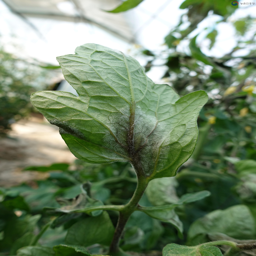

토마토_병_잎마름역병_잎_피해증상_2.JPG

Healthy trainB sample


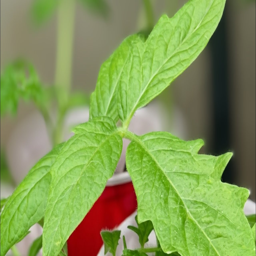

22.jpg

TestA sample


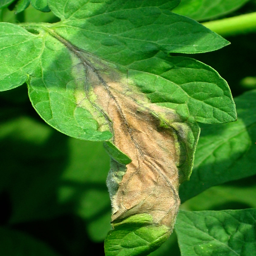

000167.jpg


In [17]:
# ============================================================
# 7. trainA / trainB / testA 샘플 확인
# ============================================================

from PIL import Image
from IPython.display import display
import random

print("Disease trainA sample")

sample_A = random.choice(list(trainA.glob("*")))
display(Image.open(sample_A).resize((256, 256)))
print(sample_A.name)

print("\nHealthy trainB sample")

sample_B = random.choice(list(trainB.glob("*")))
display(Image.open(sample_B).resize((256, 256)))
print(sample_B.name)

print("\nTestA sample")

sample_test = random.choice(list(testA.glob("*")))
display(Image.open(sample_test).resize((256, 256)))
print(sample_test.name)

In [19]:
# ============================================================
# wandb 설치
# ============================================================

!pip install wandb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.3/27.3 MB 96.2 MB/s  0:00:00m eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 66.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10/10 [wandb]m 9/10 [wandb]ic]k]


In [21]:
# ============================================================
# 8. CycleGAN 학습
# ============================================================

!python train.py \
--dataroot /home/harry/Re_leaf_Project/reaf_cyclegan_tomato \
--name reaf_tomato_cyclegan \
--model cycle_gan \
--netG resnet_6blocks \
--batch_size 1 \
--load_size 256 \
--crop_size 256 \
--n_epochs 20 \
--n_epochs_decay 10

----------------- Options ---------------
               batch_size: 1                             
                    beta1: 0.5                           
          checkpoints_dir: ./checkpoints                 
           continue_train: False                         
                crop_size: 256                           
                 dataroot: /home/harry/Re_leaf_Project/reaf_cyclegan_tomato	[default: None]
             dataset_mode: unaligned                     
                direction: AtoB                          
             display_freq: 400                           
          display_winsize: 256                           
                    epoch: latest                        
              epoch_count: 1                             
                 gan_mode: lsgan                         
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                          

In [25]:
# ============================================================
# testB 폴더 생성
# ============================================================

from pathlib import Path

testB = Path("/home/harry/Re_leaf_Project/reaf_cyclegan_tomato/testB")
testB.mkdir(parents=True, exist_ok=True)

print("testB 생성 완료:", testB)

testB 생성 완료: /home/harry/Re_leaf_Project/reaf_cyclegan_tomato/testB


In [35]:
# ============================================================
# testB에 healthy 이미지 복사
# ============================================================

from pathlib import Path
import shutil
import random

testB = Path("/home/harry/Re_leaf_Project/reaf_cyclegan_tomato/testB")
testB.mkdir(parents=True, exist_ok=True)

# 기존 testB 비우기
for f in testB.glob("*"):
    if f.is_file():
        f.unlink()

healthy_imgs = []

for img_path in trainB.rglob("*"):
    if img_path.is_file() and img_path.suffix.lower() in VALID_EXTS:
        healthy_imgs.append(img_path)

sample_B = random.sample(
    healthy_imgs,
    min(5, len(healthy_imgs))
)

for img_path in sample_B:
    shutil.copy(img_path, testB / img_path.name)

print("testB 생성 완료!")
print("testB 개수:", len(list(testB.glob("*"))))

testB 생성 완료!
testB 개수: 5


In [36]:
# ============================================================
# 9. CycleGAN 테스트 생성
# 학습 때 사용한 netG 옵션과 동일하게 맞추기
# ============================================================

!python test.py \
--dataroot /home/harry/Re_leaf_Project/reaf_cyclegan_tomato \
--name reaf_tomato_cyclegan \
--model cycle_gan \
--netG resnet_6blocks \
--phase test \
--no_dropout

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: ./checkpoints                 
                crop_size: 256                           
                 dataroot: /home/harry/Re_leaf_Project/reaf_cyclegan_tomato	[default: None]
             dataset_mode: unaligned                     
                direction: AtoB                          
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None]
                load_iter: 0                             	[default: 0]
                load_size

In [37]:
# ============================================================
# 결과 경로
# ============================================================

RESULT_DIR = Path(
    "./results/reaf_tomato_cyclegan/test_latest/images"
)

print(RESULT_DIR)

results/reaf_tomato_cyclegan/test_latest/images


생성 이미지 수: 5
KakaoTalk_20260514_124453340_fake_B.png


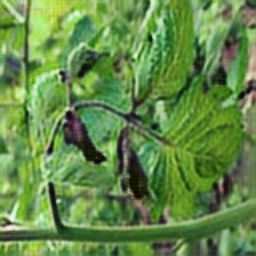

KakaoTalk_20260514_124150942_fake_B.png


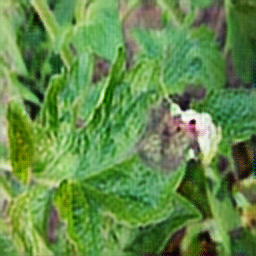

KakaoTalk_20260514_124412000_fake_B.png


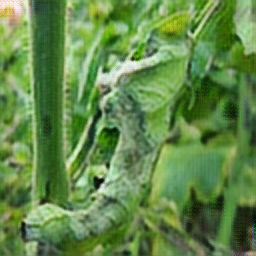

000167_fake_B.png


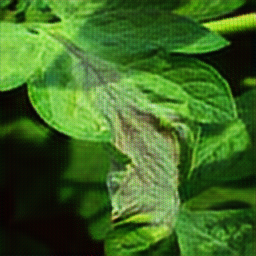

KakaoTalk_20260514_124346760_fake_B.png


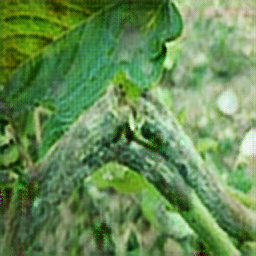

In [38]:
# ============================================================
# 생성 결과 확인
# ============================================================

from PIL import Image
from IPython.display import display

fake_imgs = list(
    RESULT_DIR.glob("*fake_B.png")
)

print("생성 이미지 수:", len(fake_imgs))

for img_path in fake_imgs[:10]:

    print(img_path.name)

    display(
        Image.open(img_path).resize((256, 256))
    )

real_A 이미지 수: 5


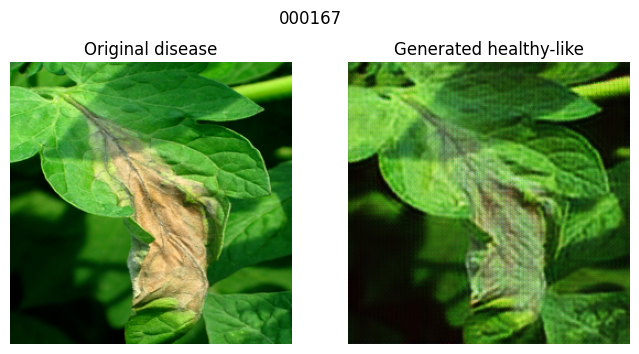

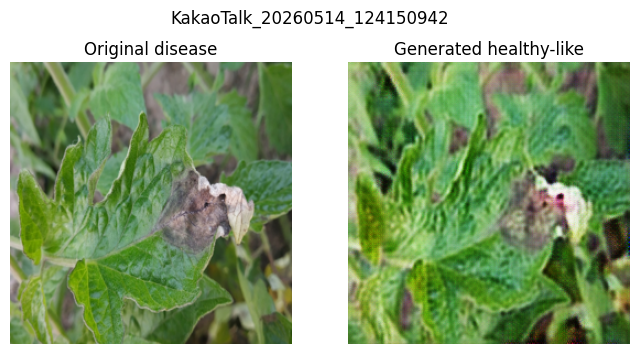

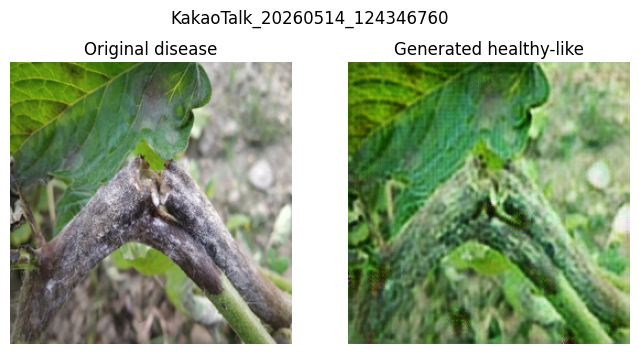

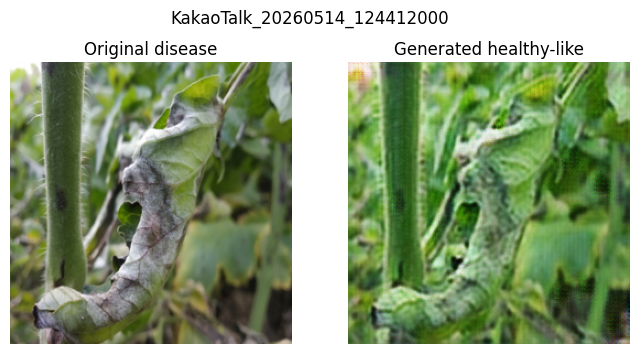

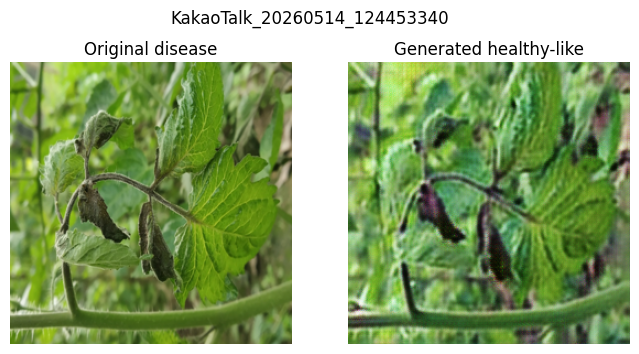

In [39]:
# ============================================================
# 원본 real_A vs 생성 fake_B 비교
# ============================================================

from pathlib import Path
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt

RESULT_DIR = Path("./results/reaf_tomato_cyclegan/test_latest/images")

real_A_imgs = sorted(list(RESULT_DIR.glob("*real_A.png")))

print("real_A 이미지 수:", len(real_A_imgs))

for real_A_path in real_A_imgs:
    fake_B_path = Path(str(real_A_path).replace("real_A", "fake_B"))

    if not fake_B_path.exists():
        print("fake_B 없음:", fake_B_path.name)
        continue

    real_img = Image.open(real_A_path).convert("RGB")
    fake_img = Image.open(fake_B_path).convert("RGB")

    fig, axes = plt.subplots(1, 2, figsize=(8, 4))

    axes[0].imshow(real_img)
    axes[0].set_title("Original disease")
    axes[0].axis("off")

    axes[1].imshow(fake_img)
    axes[1].set_title("Generated healthy-like")
    axes[1].axis("off")

    plt.suptitle(real_A_path.name.replace("_real_A.png", ""))
    plt.show()

In [33]:
# ============================================================
# 생성 이미지 전체 검색
# ============================================================

all_imgs = []

for ext in ["*.png", "*.jpg", "*.jpeg"]:
    all_imgs.extend(Path("./results").rglob(ext))

print("전체 결과 이미지 수:", len(all_imgs))

for p in all_imgs[:30]:
    print(p)

전체 결과 이미지 수: 0


In [31]:
# ============================================================
# results 폴더 안 전체 확인
# ============================================================

from pathlib import Path

base_results = Path("./results")

for p in base_results.rglob("*"):
    print(p)

In [40]:
# ============================================================
# CycleGAN v2 학습
# 512x512 + resnet_9blocks
# ============================================================

!python train.py \
--dataroot /home/harry/Re_leaf_Project/reaf_cyclegan_tomato \
--name reaf_tomato_cyclegan_v2_512 \
--model cycle_gan \
--netG resnet_9blocks \
--batch_size 1 \
--load_size 512 \
--crop_size 512 \
--n_epochs 50 \
--n_epochs_decay 20

----------------- Options ---------------
               batch_size: 1                             
                    beta1: 0.5                           
          checkpoints_dir: ./checkpoints                 
           continue_train: False                         
                crop_size: 512                           	[default: 256]
                 dataroot: /home/harry/Re_leaf_Project/reaf_cyclegan_tomato	[default: None]
             dataset_mode: unaligned                     
                direction: AtoB                          
             display_freq: 400                           
          display_winsize: 256                           
                    epoch: latest                        
              epoch_count: 1                             
                 gan_mode: lsgan                         
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3           

In [41]:
# ============================================================
# 9. CycleGAN v2 테스트 생성
# 반드시 train 때와 같은 netG 사용
# ============================================================

!python test.py \
--dataroot /home/harry/Re_leaf_Project/reaf_cyclegan_tomato \
--name reaf_tomato_cyclegan_v2_512 \
--model cycle_gan \
--netG resnet_9blocks \
--phase test \
--no_dropout

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: ./checkpoints                 
                crop_size: 256                           
                 dataroot: /home/harry/Re_leaf_Project/reaf_cyclegan_tomato	[default: None]
             dataset_mode: unaligned                     
                direction: AtoB                          
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None]
                load_iter: 0                             	[default: 0]
                load_size

In [42]:
# ============================================================
# 10. 결과 폴더 확인
# ============================================================

from pathlib import Path

RESULT_DIR_V2 = Path(
    "./results/reaf_tomato_cyclegan_v2_512/test_latest/images"
)

print(RESULT_DIR_V2)

results/reaf_tomato_cyclegan_v2_512/test_latest/images


real_A 이미지 수: 5


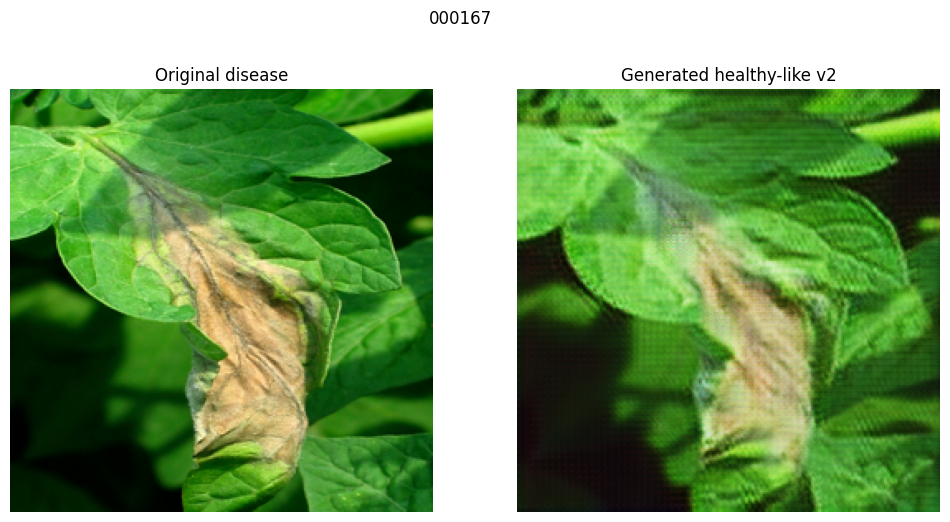

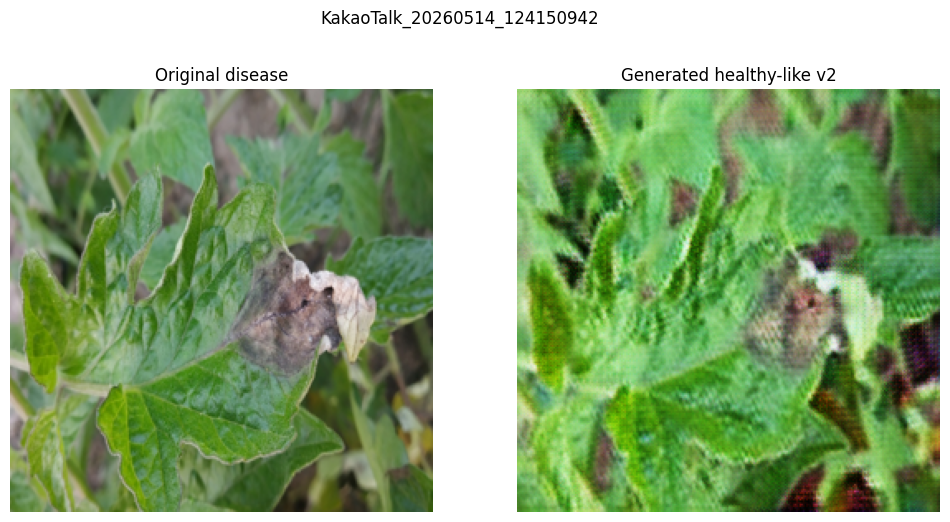

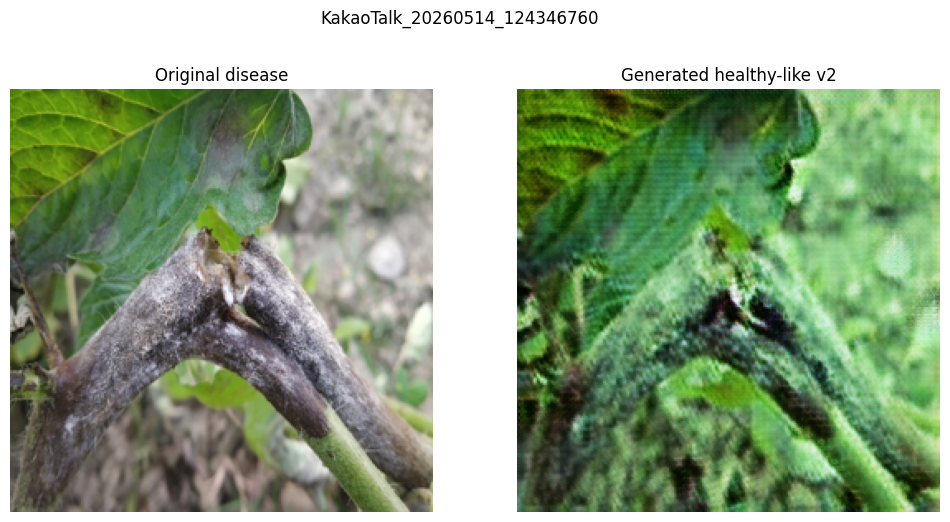

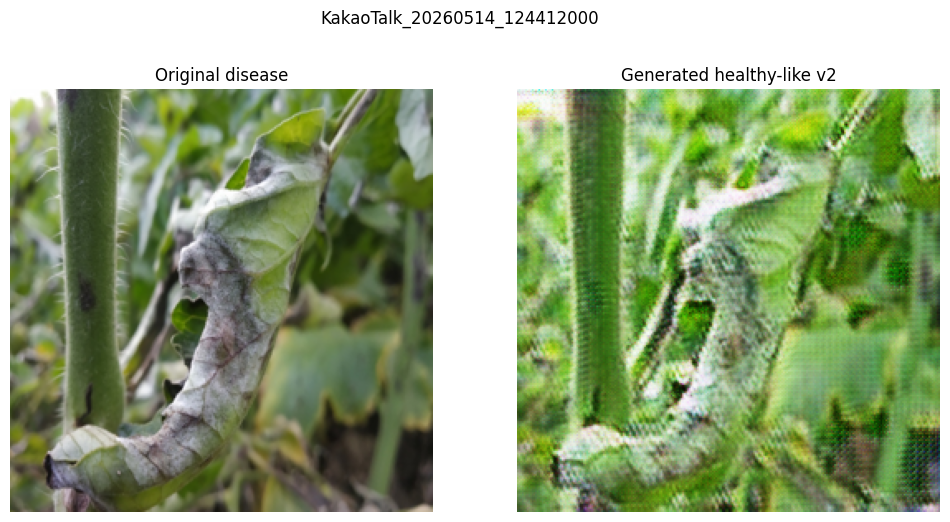

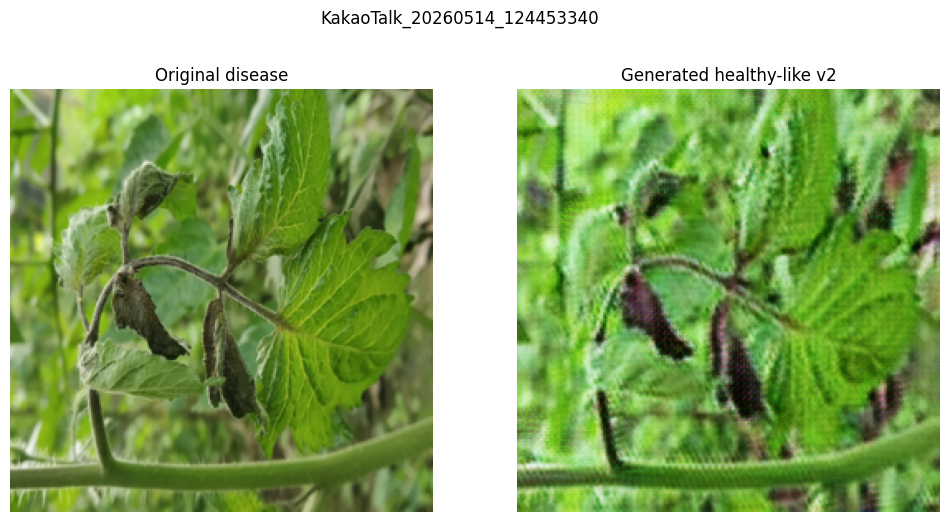

In [43]:
# ============================================================
# 11. v2 결과 비교
# Original vs Generated
# ============================================================

from PIL import Image
import matplotlib.pyplot as plt

real_A_imgs = sorted(
    list(RESULT_DIR_V2.glob("*real_A.png"))
)

print("real_A 이미지 수:", len(real_A_imgs))

for real_A_path in real_A_imgs:

    fake_B_path = Path(
        str(real_A_path).replace("real_A", "fake_B")
    )

    if not fake_B_path.exists():
        print("fake_B 없음:", fake_B_path.name)
        continue

    real_img = Image.open(real_A_path).convert("RGB")
    fake_img = Image.open(fake_B_path).convert("RGB")

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(12, 6)
    )

    axes[0].imshow(real_img)
    axes[0].set_title("Original disease")
    axes[0].axis("off")

    axes[1].imshow(fake_img)
    axes[1].set_title("Generated healthy-like v2")
    axes[1].axis("off")

    plt.suptitle(
        real_A_path.name.replace("_real_A.png", "")
    )

    plt.show()

v1 fake_B 수: 5


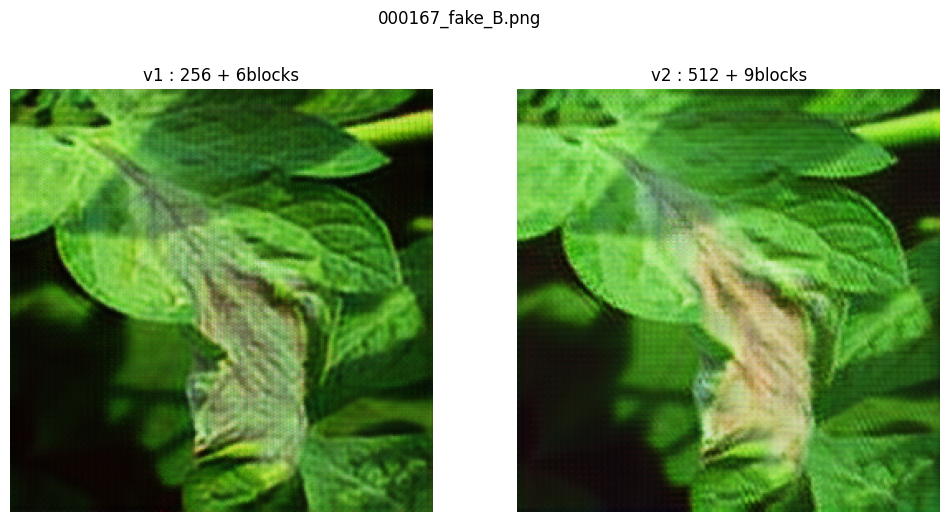

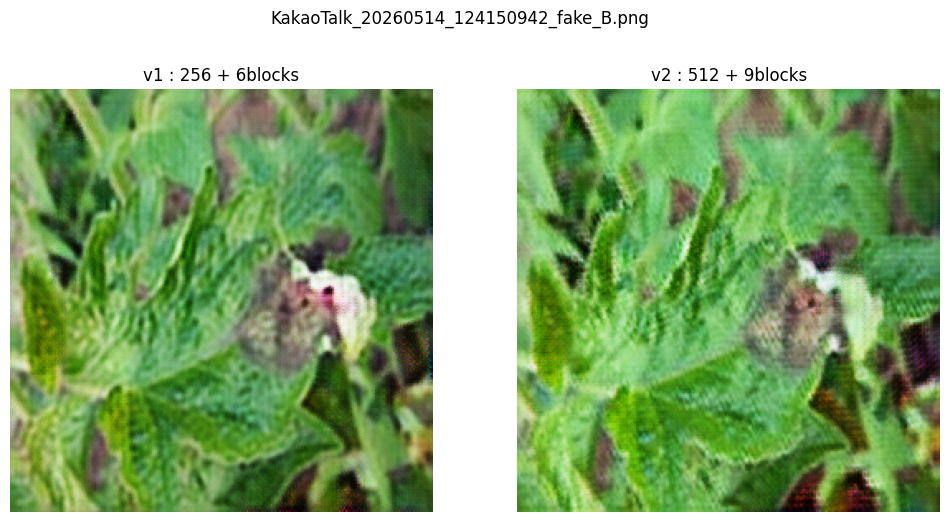

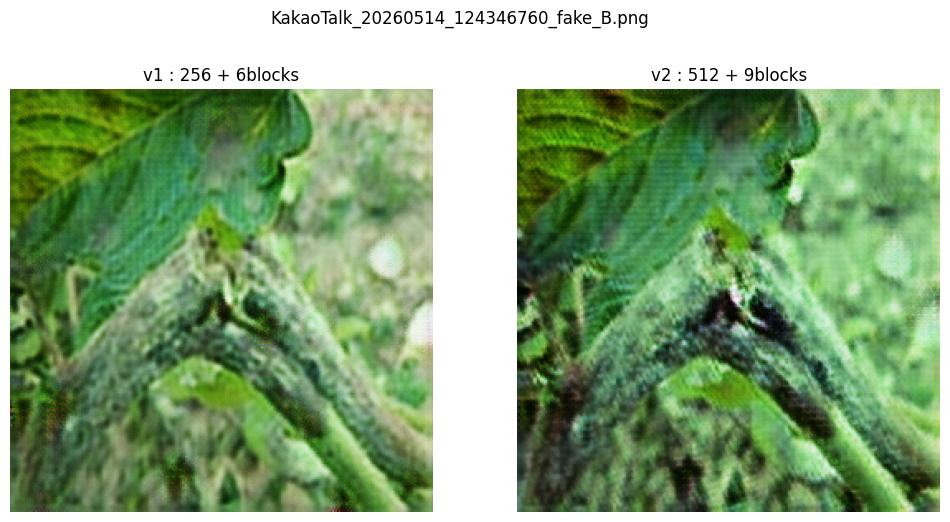

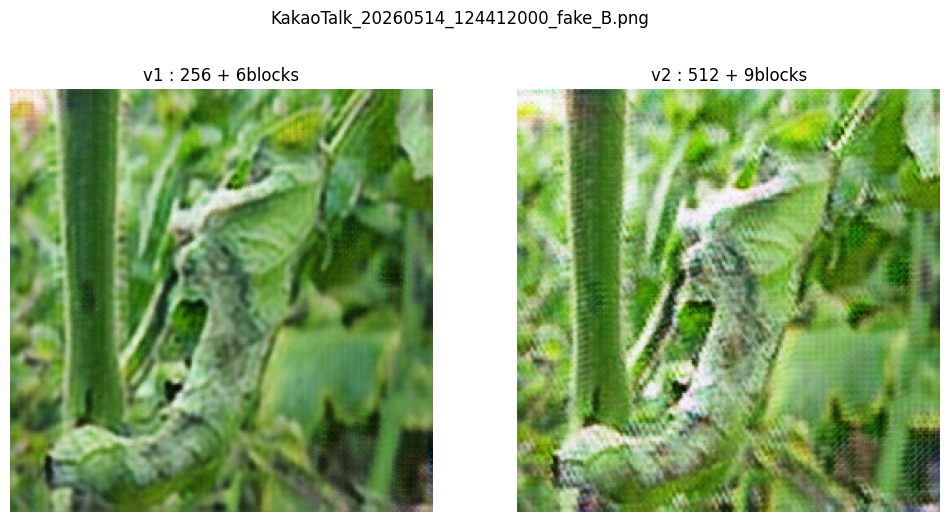

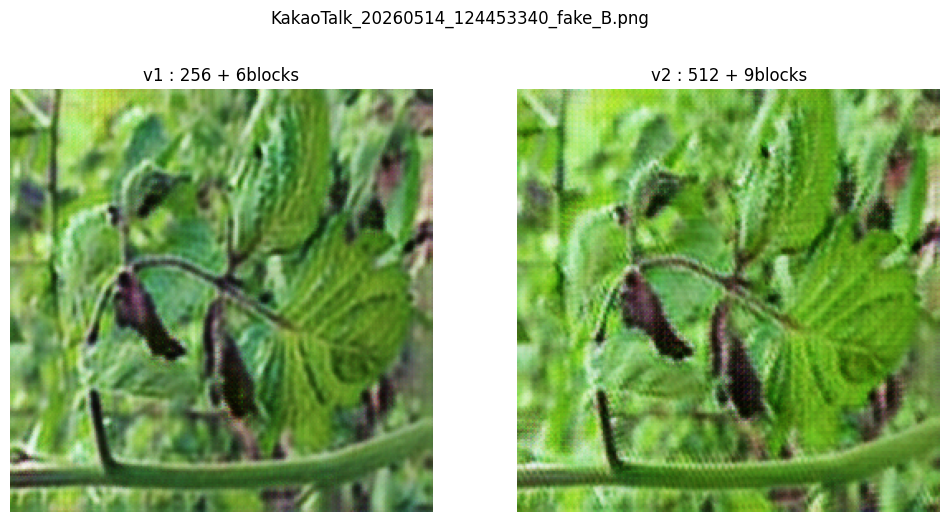

In [44]:
# ============================================================
# 12. v1 vs v2 비교
# ============================================================

from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

RESULT_DIR_V1 = Path(
    "./results/reaf_tomato_cyclegan/test_latest/images"
)

RESULT_DIR_V2 = Path(
    "./results/reaf_tomato_cyclegan_v2_512/test_latest/images"
)

v1_imgs = sorted(
    list(RESULT_DIR_V1.glob("*fake_B.png"))
)

print("v1 fake_B 수:", len(v1_imgs))

for v1_path in v1_imgs[:5]:

    filename = v1_path.name

    v2_path = RESULT_DIR_V2 / filename

    if not v2_path.exists():
        continue

    v1_img = Image.open(v1_path).convert("RGB")
    v2_img = Image.open(v2_path).convert("RGB")

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(12, 6)
    )

    axes[0].imshow(v1_img)
    axes[0].set_title("v1 : 256 + 6blocks")
    axes[0].axis("off")

    axes[1].imshow(v2_img)
    axes[1].set_title("v2 : 512 + 9blocks")
    axes[1].axis("off")

    plt.suptitle(filename)

    plt.show()